# TITLE

## Infos zu Experiment:
- Zustand Zellen, Benutzte FBS Konz., Dichte der Zellen, Wartezeit etc. 

## Data Loading and Preprocessing

### Load required libraries and specify the data folder

In [2]:
import os
import pandas as pd
import matplotlib.pyplot as plt 
import plotly.express as px
import seaborn as sns
import numpy as np
import scipy
from scipy.stats import pearsonr, spearmanr, linregress
from scipy.integrate import simpson
import matplotlib.patches as mpatches

data_folder = "\\\\izbkingston.unibe.ch\\imaging.data\\PertzLab\\optoRTK_CedricZ\\experimental_data"
experiment_name = "2025-11-03_3-2-1minIntervals"
exp_path = os.path.join(data_folder, experiment_name)


### Load analysed data from rtm-pymmcore experiment

This loads the data from the individual field of views and create one big dataframe. This dataframe is then saved in your local folder and used to plot the data.

### Data clean-up
Add Cytoplasma to nuclear ratio based on measured intensities. Further normalise according to the first few frames. Remove cells which were not tracked for 80% of the frames.

In [3]:
df = pd.read_parquet("exp_data.parquet")

In [4]:
df

,mean_intensity_C0_nuc,mean_intensity_C1_nuc,label,x,y,area,median_intensity_C0_nuc,median_intensity_C1_nuc,mean_intensity_C0_ring,mean_intensity_C1_ring,...,stim_timestep,stim_exposure_list,stim_power,stim_channel_name,stim_channel_group,stim_channel_device_name,stim_channel_power_property_name,stim_exposure,stim,optocheck_mean_intensity
0,1933.671506,15295.230490,3,168.551724,660.101633,551.0,1930.0,15878.0,441.762376,5998.643564,...,"[10, 13, 16, 19, 22, 25, 28, 31, 34, 37, 40, 4...","[50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 5...",10,CyanStim,TTL_ERK,Spectra,Cyan_Level,0.0,False,853.996988
1,1373.912060,7746.080402,16,474.839196,984.155779,398.0,1390.0,8064.0,401.812865,2870.157895,...,"[10, 13, 16, 19, 22, 25, 28, 31, 34, 37, 40, 4...","[50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 5...",10,CyanStim,TTL_ERK,Spectra,Cyan_Level,0.0,False,1717.342105
2,4889.500000,675.598765,20,526.444444,779.901235,162.0,5184.5,678.0,744.762295,704.729508,...,"[10, 13, 16, 19, 22, 25, 28, 31, 34, 37, 40, 4...","[50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 5...",10,CyanStim,TTL_ERK,Spectra,Cyan_Level,0.0,False,767.907162
3,1123.695455,670.945455,31,664.490909,794.413636,220.0,1126.0,666.0,540.197080,668.846715,...,"[10, 13, 16, 19, 22, 25, 28, 31, 34, 37, 40, 4...","[50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 5...",10,CyanStim,TTL_ERK,Spectra,Cyan_Level,0.0,False,861.760417
4,2711.843694,29446.596803,39,782.669627,716.605684,563.0,2747.0,29621.0,473.694581,22218.403941,...,"[10, 13, 16, 19, 22, 25, 28, 31, 34, 37, 40, 4...","[50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 5...",10,CyanStim,TTL_ERK,Spectra,Cyan_Level,0.0,False,1079.592857
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17040,4040.626050,16511.684874,91,962.836134,499.852941,238.0,4144.5,17063.0,613.645455,6930.045455,...,"[10, 13, 16, 19, 22, 25, 28, 31, 34, 37, 40, 4...","[50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 5...",10,CyanStim,TTL_ERK,Spectra,Cyan_Level,0.0,False,983.840336
17041,5034.861272,15923.341040,93,974.630058,487.554913,173.0,5242.0,16608.0,726.373737,5219.868687,...,"[10, 13, 16, 19, 22, 25, 28, 31, 34, 37, 40, 4...","[50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 5...",10,CyanStim,TTL_ERK,Spectra,Cyan_Level,0.0,False,956.705202
17042,1114.377939,7094.415913,94,1001.054250,288.990958,553.0,1190.0,7650.0,328.530303,2601.176768,...,"[10, 13, 16, 19, 22, 25, 28, 31, 34, 37, 40, 4...","[50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 5...",10,CyanStim,TTL_ERK,Spectra,Cyan_Level,0.0,False,685.072333
17043,1524.188235,5841.929412,95,1002.650980,471.052941,510.0,1544.0,5895.5,396.188482,3097.267016,...,"[10, 13, 16, 19, 22, 25, 28, 31, 34, 37, 40, 4...","[50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 50, 5...",10,CyanStim,TTL_ERK,Spectra,Cyan_Level,0.0,False,642.856863


In [5]:
df["cnr"] = df["mean_intensity_C1_ring"] / df["mean_intensity_C1_nuc"]
df["cnr_median"] = df["median_intensity_C1_ring"] / df["median_intensity_C1_nuc"]
df["uid"] = df["fov"].astype("string") + "_" + df["particle"].astype("string")
df["frame"] = df["timestep"]
os.makedirs("figures", exist_ok=True)

frame_counts = df["uid"].value_counts()
threshold = 0.9 * frame_counts.max()

valid_uids = frame_counts[frame_counts >= threshold].index
df = df[df["uid"].isin(valid_uids)]

### Median

In [ ]:
NORM_UNTIL_TIMEPOINT = 10
median_cnr_first_ten_frames = df[df['frame'] < NORM_UNTIL_TIMEPOINT].groupby('uid')['cnr_median'].median()
def normalize_cnr(row):
    return row['cnr_median'] / median_cnr_first_ten_frames[row['uid']] if row['uid'] in median_cnr_first_ten_frames else np.nan
df["cnr_median_norm"] = df.apply(normalize_cnr, axis=1)
df.dropna(subset=["cnr_median_norm"], inplace=True) 

### Mean

In [6]:
NORM_UNTIL_TIMEPOINT = 10
mean_cnr_first_ten_frames = df[df['frame'] < NORM_UNTIL_TIMEPOINT].groupby('uid')['cnr'].median()
def normalize_cnr(row):
    return row['cnr'] / mean_cnr_first_ten_frames[row['uid']] if row['uid'] in mean_cnr_first_ten_frames else np.nan
df["cnr_norm"] = df.apply(normalize_cnr, axis=1)
df.dropna(subset=["cnr_norm"], inplace=True) 

C:\Users\czahn\AppData\Local\Temp\ipykernel_15756\3492331511.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["cnr_norm"] = df.apply(normalize_cnr, axis=1)
C:\Users\czahn\AppData\Local\Temp\ipykernel_15756\3492331511.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(subset=["cnr_norm"], inplace=True)


In [ ]:
df

,mean_intensity_C0_nuc,mean_intensity_C1_nuc,label,x,y,area,median_intensity_C0_nuc,median_intensity_C1_nuc,mean_intensity_C0_ring,mean_intensity_C1_ring,...,stim_channel_name,stim_channel_group,stim_channel_device_name,stim_channel_power_property_name,stim_exposure,stim,optocheck_mean_intensity,uid,frame,cnr_norm
0,1933.671506,15295.230490,3,168.551724,660.101633,551.0,1930.0,15878.0,441.762376,5998.643564,...,CyanStim,TTL_ERK,Spectra,Cyan_Level,0.0,False,853.996988,0_2,0,1.000518
1,1373.912060,7746.080402,16,474.839196,984.155779,398.0,1390.0,8064.0,401.812865,2870.157895,...,CyanStim,TTL_ERK,Spectra,Cyan_Level,0.0,False,1717.342105,0_15,0,0.998616
2,4889.500000,675.598765,20,526.444444,779.901235,162.0,5184.5,678.0,744.762295,704.729508,...,CyanStim,TTL_ERK,Spectra,Cyan_Level,0.0,False,767.907162,0_19,0,1.018758
3,1123.695455,670.945455,31,664.490909,794.413636,220.0,1126.0,666.0,540.197080,668.846715,...,CyanStim,TTL_ERK,Spectra,Cyan_Level,0.0,False,861.760417,0_30,0,1.000000
4,2711.843694,29446.596803,39,782.669627,716.605684,563.0,2747.0,29621.0,473.694581,22218.403941,...,CyanStim,TTL_ERK,Spectra,Cyan_Level,0.0,False,1079.592857,0_37,0,1.011522
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17034,1107.156695,6016.693732,85,824.413105,81.703704,702.0,1148.5,6139.5,489.192661,3443.183486,...,CyanStim,TTL_ERK,Spectra,Cyan_Level,0.0,False,649.625356,59_99,209,1.028499
17035,3591.494105,3440.141479,86,826.130761,548.793140,933.0,3569.0,3508.0,456.612245,2537.097959,...,CyanStim,TTL_ERK,Spectra,Cyan_Level,0.0,False,642.646302,59_104,209,0.936284
17038,5054.740132,6072.259868,89,882.134868,728.378289,608.0,5196.0,6053.5,627.146341,5405.258537,...,CyanStim,TTL_ERK,Spectra,Cyan_Level,0.0,False,714.684211,59_107,209,0.969598
17042,1114.377939,7094.415913,94,1001.054250,288.990958,553.0,1190.0,7650.0,328.530303,2601.176768,...,CyanStim,TTL_ERK,Spectra,Cyan_Level,0.0,False,685.072333,59_109,209,1.134946


Delete specific fucked-up cells

In [7]:
df_manual_filtering = pd.read_csv(os.path.join(exp_path, "cell_selection.csv"))
df_manual_filtering

,particle,label,fov,uid,selected,deleted
0,54,54,15,15_54,False,True
1,55,55,15,15_55,False,True
2,23,23,15,15_23,False,True
3,26,26,15,15_26,False,True
4,21,21,15,15_21,False,True
5,46,46,15,15_46,False,True
6,56,56,15,15_56,False,True
7,9,9,15,15_9,False,True
8,6,6,18,18_6,False,True
9,14,14,18,18_14,False,True


In [8]:
# Step 1: Get list of uids to delete
uids_to_delete = df_manual_filtering[df_manual_filtering["deleted"] == True]["uid"]

# Step 2: Remove these uids from the main dataframe
df = df[~df["uid"].isin(uids_to_delete)]

Calculate ERK-activity baseline for each cell_id

In [9]:
# Calculate the mean CNR for each cell_id from timestep 0 to 9
# Step 1: Filter to frames 0–9
df_0_9 = df[(df['frame'] >= 0) & (df['frame'] <= 9)].copy()

# Step 2: Group by 'cell_id' and calculate the median cnr
median_cnr = df_0_9.groupby('uid')['cnr'].median().reset_index()
median_cnr.rename(columns={'cnr': 'median_cnr_0_9'}, inplace=True)

# Step 3: Merge the median_cnr back into the main df
df = df.merge(median_cnr, on='uid', how='left')

In [10]:
df = df[df['median_cnr_0_9'] <= 0.8]

In [11]:
df

,mean_intensity_C0_nuc,mean_intensity_C1_nuc,label,x,y,area,median_intensity_C0_nuc,median_intensity_C1_nuc,mean_intensity_C0_ring,mean_intensity_C1_ring,...,stim_channel_group,stim_channel_device_name,stim_channel_power_property_name,stim_exposure,stim,optocheck_mean_intensity,uid,frame,cnr_norm,median_cnr_0_9
0,1933.671506,15295.230490,3,168.551724,660.101633,551.0,1930.0,15878.0,441.762376,5998.643564,...,TTL_ERK,Spectra,Cyan_Level,0.0,False,853.996988,0_2,0,1.000518,0.391987
1,1373.912060,7746.080402,16,474.839196,984.155779,398.0,1390.0,8064.0,401.812865,2870.157895,...,TTL_ERK,Spectra,Cyan_Level,0.0,False,1717.342105,0_15,0,0.998616,0.371044
4,2711.843694,29446.596803,39,782.669627,716.605684,563.0,2747.0,29621.0,473.694581,22218.403941,...,TTL_ERK,Spectra,Cyan_Level,0.0,False,1079.592857,0_37,0,1.011522,0.745938
5,1937.128801,15030.520572,3,170.107335,660.037567,559.0,1914.0,15540.0,420.472906,5914.103448,...,TTL_ERK,Spectra,Cyan_Level,0.0,False,853.996988,0_2,1,1.003790,0.391987
6,1375.891089,7578.388614,16,476.259901,983.779703,404.0,1388.5,7865.5,391.845714,2848.205714,...,TTL_ERK,Spectra,Cyan_Level,0.0,False,1717.342105,0_15,1,1.012906,0.371044
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
631052,2313.136139,7917.316832,83,808.858911,419.403465,404.0,2375.5,8215.5,412.825843,3629.853933,...,TTL_ERK,Spectra,Cyan_Level,0.0,False,824.274752,59_101,209,0.862217,0.531734
631054,1107.156695,6016.693732,85,824.413105,81.703704,702.0,1148.5,6139.5,489.192661,3443.183486,...,TTL_ERK,Spectra,Cyan_Level,0.0,False,649.625356,59_99,209,1.028499,0.556414
631055,3591.494105,3440.141479,86,826.130761,548.793140,933.0,3569.0,3508.0,456.612245,2537.097959,...,TTL_ERK,Spectra,Cyan_Level,0.0,False,642.646302,59_104,209,0.936284,0.787686
631057,1114.377939,7094.415913,94,1001.054250,288.990958,553.0,1190.0,7650.0,328.530303,2601.176768,...,TTL_ERK,Spectra,Cyan_Level,0.0,False,685.072333,59_109,209,1.134946,0.323056


In [5]:
df.to_parquet("data_filtered.parquet")

# CSV Export

In [10]:
df[["cell_line", "uid", "stim_power", "stim_exposure", "stim_strength", "stim_timestep", "optocheck_mean_intensity", "timestep", "cnr", "cnr_median", "cnr_norm", "expression_group"]].to_csv("filtered_data.csv", index=False)

## Results

In [2]:
df = pd.read_parquet("data_filtered.parquet")

In [21]:
df

,mean_intensity_C0_nuc,mean_intensity_C1_nuc,label,x,y,area,median_intensity_C0_nuc,median_intensity_C1_nuc,mean_intensity_C0_ring,mean_intensity_C1_ring,...,stim_channel_power_property_name,stim_exposure,stim,optocheck_mean_intensity,uid,frame,cnr_norm,median_cnr_0_9,stim_strength,expression_group
0,1933.671506,15295.230490,3,168.551724,660.101633,551.0,1930.0,15878.0,441.762376,5998.643564,...,Cyan_Level,0.0,False,853.996988,0_2,0,1.000518,0.391987,50 ms,Low
1,1373.912060,7746.080402,16,474.839196,984.155779,398.0,1390.0,8064.0,401.812865,2870.157895,...,Cyan_Level,0.0,False,1717.342105,0_15,0,0.998616,0.371044,50 ms,High
4,2711.843694,29446.596803,39,782.669627,716.605684,563.0,2747.0,29621.0,473.694581,22218.403941,...,Cyan_Level,0.0,False,1079.592857,0_37,0,1.011522,0.745938,50 ms,High
5,1937.128801,15030.520572,3,170.107335,660.037567,559.0,1914.0,15540.0,420.472906,5914.103448,...,Cyan_Level,0.0,False,853.996988,0_2,1,1.003790,0.391987,50 ms,Low
6,1375.891089,7578.388614,16,476.259901,983.779703,404.0,1388.5,7865.5,391.845714,2848.205714,...,Cyan_Level,0.0,False,1717.342105,0_15,1,1.012906,0.371044,50 ms,High
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
639823,2313.136139,7917.316832,83,808.858911,419.403465,404.0,2375.5,8215.5,412.825843,3629.853933,...,Cyan_Level,0.0,False,824.274752,59_101,209,0.862217,0.531734,500 ms,High
639825,1107.156695,6016.693732,85,824.413105,81.703704,702.0,1148.5,6139.5,489.192661,3443.183486,...,Cyan_Level,0.0,False,649.625356,59_99,209,1.028499,0.556414,500 ms,Low
639826,3591.494105,3440.141479,86,826.130761,548.793140,933.0,3569.0,3508.0,456.612245,2537.097959,...,Cyan_Level,0.0,False,642.646302,59_104,209,0.936284,0.787686,500 ms,Low
639828,1114.377939,7094.415913,94,1001.054250,288.990958,553.0,1190.0,7650.0,328.530303,2601.176768,...,Cyan_Level,0.0,False,685.072333,59_109,209,1.134946,0.323056,500 ms,Low


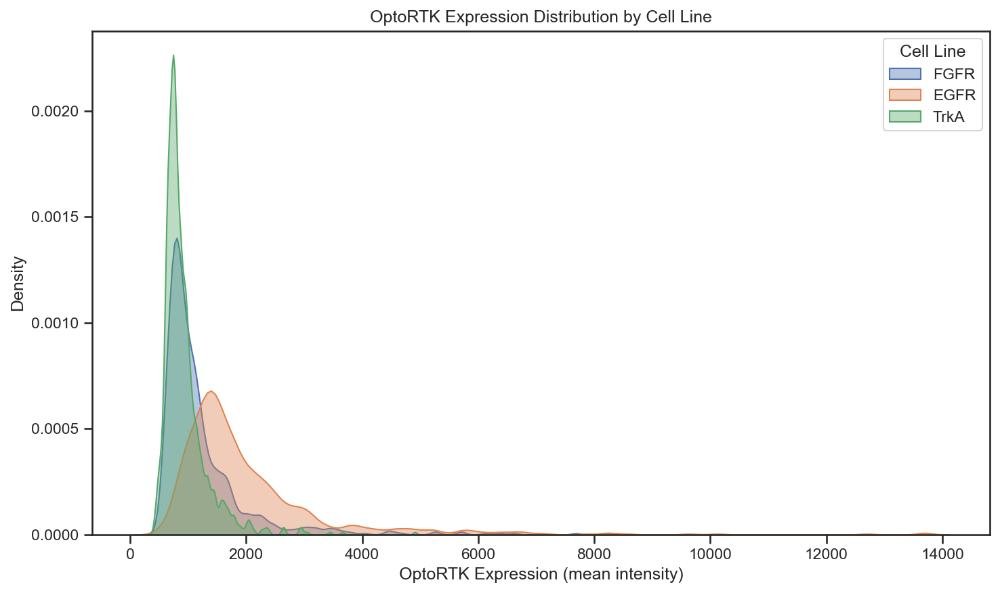

In [34]:
df_filtered_optocheck = df[df["optocheck_mean_intensity"] < 1000000]
plt.figure(figsize=(10, 6), dpi=150)

# Plot one KDE per cell line
unique_cell_lines = df_filtered_optocheck["cell_line"].unique()
for cell_line in unique_cell_lines:
    subset = df_filtered_optocheck[df_filtered_optocheck["cell_line"] == cell_line]
    sns.kdeplot(
        data=subset,
        x="optocheck_mean_intensity",
        fill=True,
        common_norm=False,
        alpha=0.4,
        label=f"{cell_line}"
    )

# Final plot settings
plt.xlabel("OptoRTK Expression (mean intensity)")
plt.ylabel("Density")
plt.title("OptoRTK Expression Distribution by Cell Line")
plt.legend(title="Cell Line", loc="upper right")
plt.tight_layout()
plt.show()

In [25]:
df["stim_strength"] = pd.cut(
    df["fov"],
    bins=[0, 15, 30, 45, 60],
    labels=["50 ms", "100 ms", "250 ms", "500 ms"],
    right=False
)

# Create 2 populations per stim_stength and cell_line, custom for each cell line, top and bottom 50% based on optoRTK expression

df["expression_group"] = (
    df.groupby("cell_line")["optocheck_mean_intensity"]
      .transform(lambda x: pd.qcut(
          x,
          q=4,
          labels=["weak", "medium", "high", "top"]
      ))
)
 

In [16]:
df

,mean_intensity_C0_nuc,mean_intensity_C1_nuc,label,x,y,area,median_intensity_C0_nuc,median_intensity_C1_nuc,mean_intensity_C0_ring,mean_intensity_C1_ring,...,stim_channel_power_property_name,stim_exposure,stim,optocheck_mean_intensity,uid,frame,cnr_norm,median_cnr_0_9,stim_strength,expression_group
0,1200.410842,3319.252496,6,93.232525,523.128388,701.0,1230.0,3258.0,409.140271,3060.289593,...,Cyan_Level,0.0,False,929.042654,0_5,0,1.030485,0.894706,50 ms,Low
2,1131.506667,2432.664762,20,287.575238,553.696190,1050.0,1145.0,2443.5,420.123077,2226.115385,...,Cyan_Level,0.0,False,1439.846960,0_19,0,1.020497,0.896714,50 ms,High
3,1387.221461,2029.439498,21,357.606164,541.253425,876.0,1385.5,2065.0,425.704453,2067.615385,...,Cyan_Level,0.0,False,858.772600,0_20,0,1.026299,0.992704,50 ms,Low
5,1317.899595,6351.889879,47,889.259919,580.523077,1235.0,1319.0,6337.0,418.218638,5289.720430,...,Cyan_Level,0.0,False,917.021231,0_46,0,1.007408,0.826655,50 ms,Low
7,1208.114731,3232.643059,6,94.995751,522.313031,706.0,1235.5,3187.0,402.203620,2966.276018,...,Cyan_Level,0.0,False,929.042654,0_5,1,1.025589,0.894706,50 ms,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
658699,980.224793,4081.717355,162,990.140496,178.327273,605.0,1005.0,4226.0,345.756098,1496.478049,...,Cyan_Level,0.0,False,602.919008,89_145,119,0.951299,0.385399,400 ms,Low
658700,815.103918,3833.647359,163,996.069847,93.444634,587.0,829.0,3938.0,336.920398,1604.368159,...,Cyan_Level,0.0,False,544.402044,89_147,119,0.962988,0.434581,400 ms,Low
658701,605.733753,2061.715933,165,1005.041929,508.083857,954.0,607.0,2076.0,348.317972,1674.244240,...,Cyan_Level,0.0,False,630.537736,89_149,119,0.972103,0.835368,400 ms,Low
658702,1052.107969,3870.991003,166,1009.083548,946.674807,1556.0,1042.0,3956.0,337.080569,2770.218009,...,Cyan_Level,0.0,False,580.503856,89_148,119,1.097956,0.651789,400 ms,Low


In [15]:
df = df[df["stim_strength"] != "50 ms"]

### Multiple Stimulation

#### Not normalised

In [26]:
df_plot = df
df_plot.loc[:, "stim_timestep"] = df_plot["stim_timestep"].apply(tuple)
df_plot["stim_timestep"].unique()

array([(np.int64(10), np.int64(13), np.int64(16), np.int64(19), np.int64(22), np.int64(25), np.int64(28), np.int64(31), np.int64(34), np.int64(37), np.int64(40), np.int64(43), np.int64(46), np.int64(49), np.int64(52), np.int64(55), np.int64(58), np.int64(61), np.int64(64), np.int64(67), np.int64(70), np.int64(72), np.int64(74), np.int64(76), np.int64(78), np.int64(80), np.int64(82), np.int64(84), np.int64(86), np.int64(88), np.int64(90), np.int64(92), np.int64(94), np.int64(96), np.int64(98), np.int64(100), np.int64(102), np.int64(104), np.int64(106), np.int64(108), np.int64(110), np.int64(112), np.int64(114), np.int64(116), np.int64(118), np.int64(120), np.int64(122), np.int64(124), np.int64(126), np.int64(128), np.int64(130), np.int64(131), np.int64(132), np.int64(133), np.int64(134), np.int64(135), np.int64(136), np.int64(137), np.int64(138), np.int64(139), np.int64(140), np.int64(141), np.int64(142), np.int64(143), np.int64(144), np.int64(145), np.int64(146), np.int64(147), np.int6

In [17]:
stim_strength_list = {
    "100 ms": list(range(15, 30)),  # 15–29
    "250 ms": list(range(30, 45)),  # 30–44
    "500 ms": list(range(45, 60)),  # 45–59
}

#### not normalised

In [18]:
stim_order = ["100 ms", "250 ms", "500 ms"]

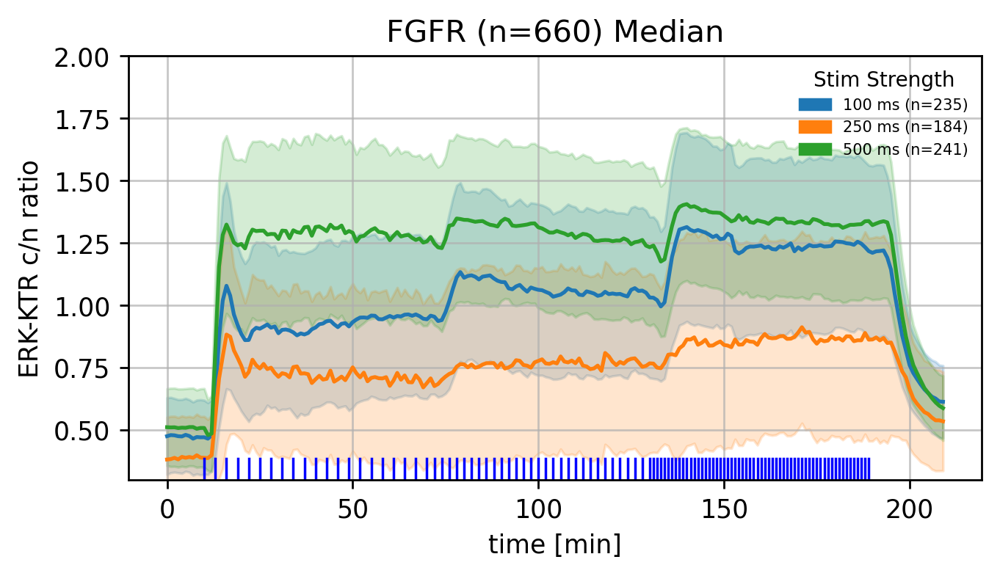

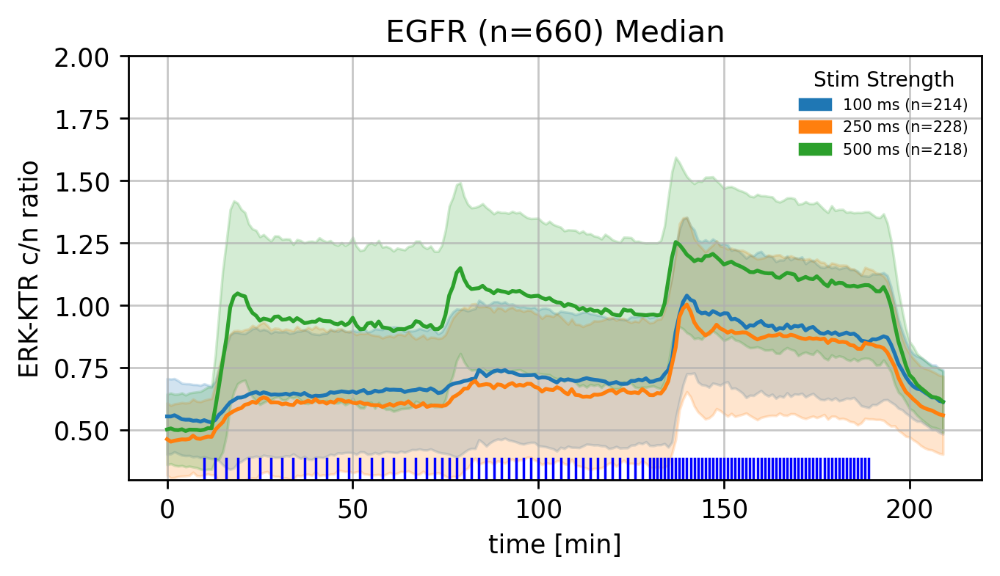

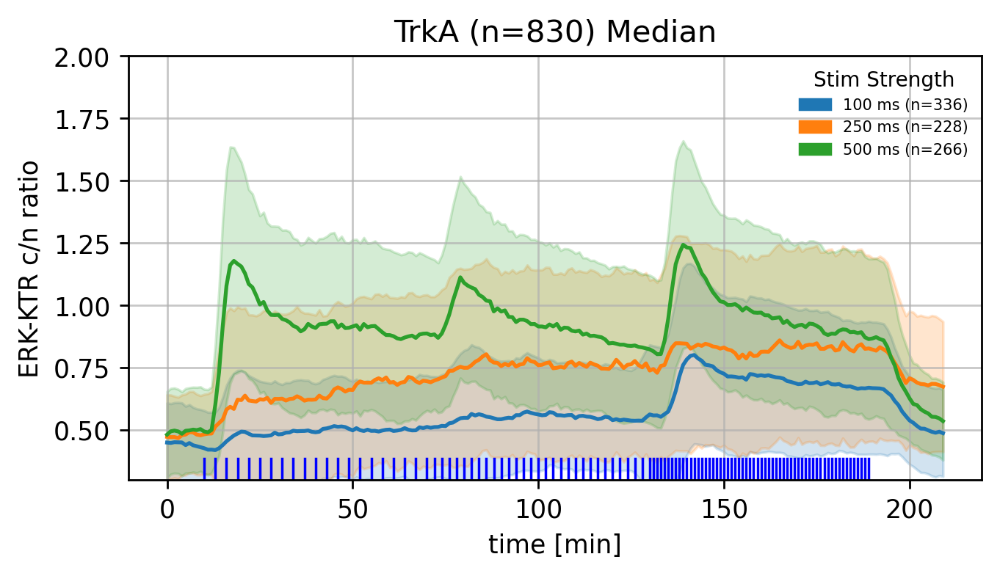

In [19]:
cell_lines = df_plot["cell_line"].unique()
stim_order = ["100 ms", "250 ms", "500 ms"]  # ✅ enforce order

for cell_line in cell_lines: 
    plt.figure(figsize=(6, 3), dpi=250)
    num_cells = df_plot.query("cell_line == @cell_line")["uid"].nunique()

    plt.grid(True, linestyle='-', alpha=0.7)

    ax = sns.lineplot(
        data=df_plot.query("cell_line == @cell_line"), 
        x='frame', 
        y='cnr_median', 
        estimator="median", 
        hue="stim_strength", 
        hue_order=stim_order, 
        errorbar='sd'
    )

    # --- build custom legend with correct colors in the same order ---
    legend_handles = []
    lines = ax.get_lines()
    for stim_strength, line in zip(stim_order, lines):
        n_cells = df_plot.query("cell_line == @cell_line and stim_strength == @stim_strength")["uid"].nunique()
        color = line.get_color()
        legend_handles.append(
            mpatches.Patch(color=color, label=f"{stim_strength} (n={n_cells})")
        )

    plt.ylabel('ERK-KTR c/n ratio')
    plt.xlabel('time [min]')

    # blue stimulation ramp
    for x in range(10, 70, 3):
        plt.axvline(x=x, color='blue', linestyle='-', ymin=0.0, ymax=0.05, linewidth=1)

    for x in range(70, 130, 2):
        plt.axvline(x=x, color='blue', linestyle='-', ymin=0.0, ymax=0.05, linewidth=1)
    
    for x in range(130, 190, 1):
        plt.axvline(x=x, color='blue', linestyle='-', ymin=0.0, ymax=0.05, linewidth=1)

    plt.ylim(0.3, 2)
    plt.title(f"{cell_line} (n={num_cells}) Median")

    plt.legend(
    handles=legend_handles,
    frameon=False,
    title="Stim Strength",
    loc="upper right",
    fontsize=6,
    title_fontsize=8
)

    plt.savefig(f"figures/{cell_line}_multi_erkktr.png", bbox_inches='tight')
    plt.show()


individual traces

<Figure size 7200x3600 with 0 Axes>

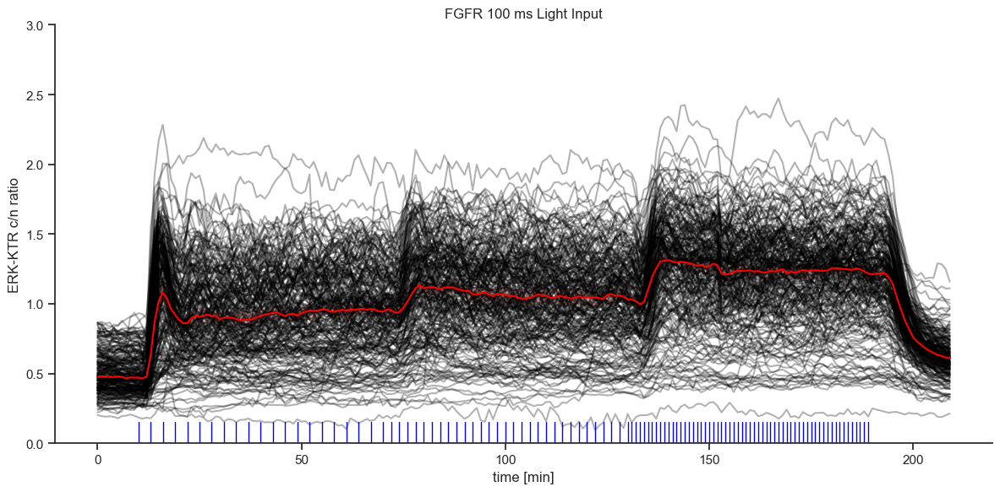

<Figure size 7200x3600 with 0 Axes>

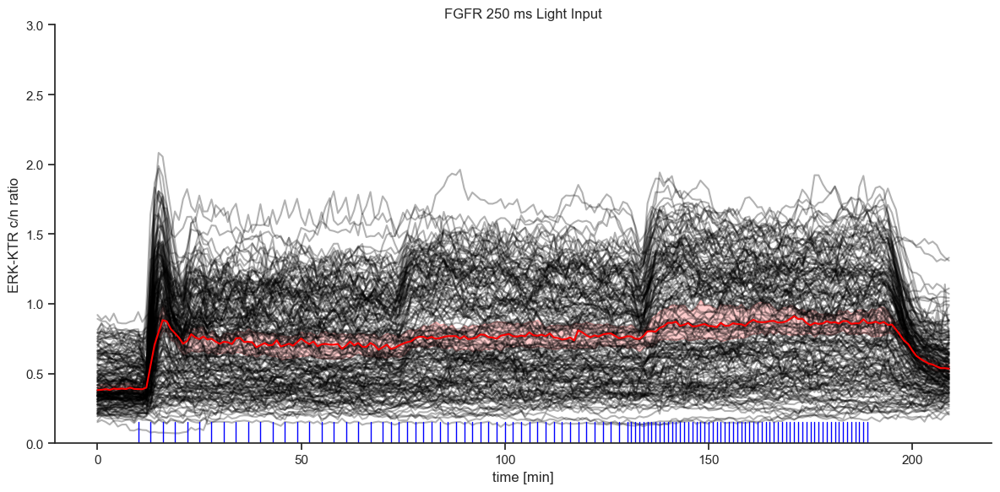

<Figure size 7200x3600 with 0 Axes>

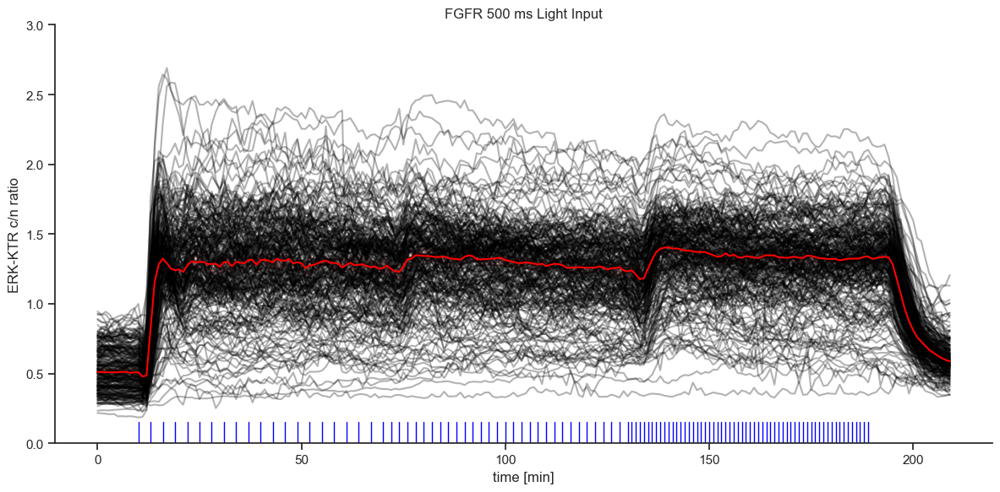

<Figure size 7200x3600 with 0 Axes>

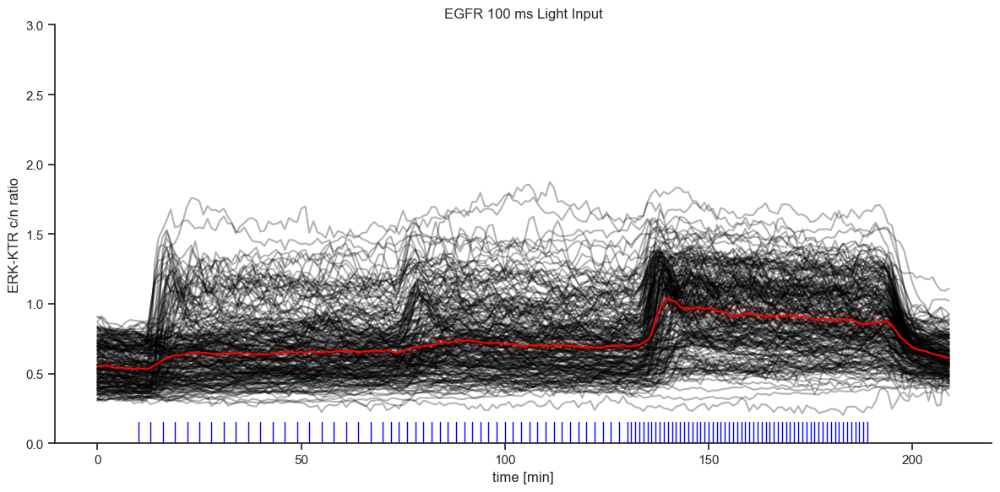

<Figure size 7200x3600 with 0 Axes>

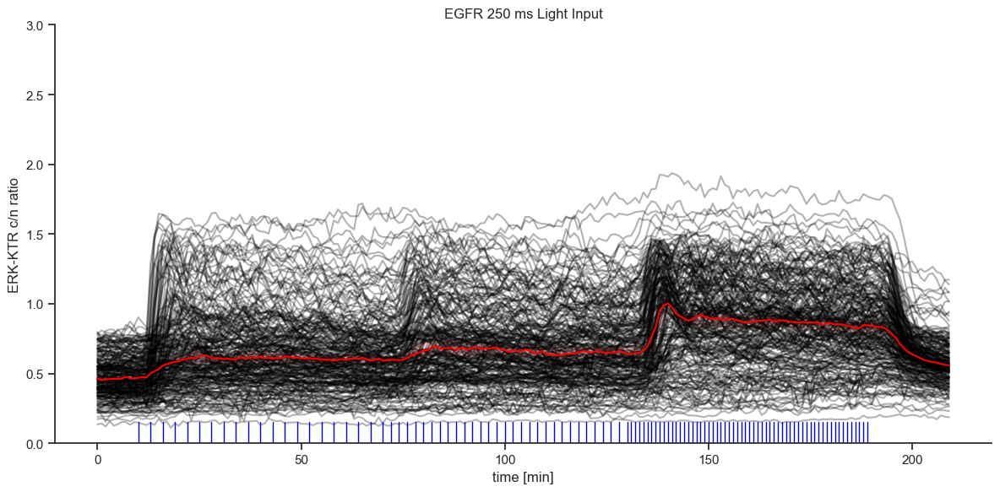

<Figure size 7200x3600 with 0 Axes>

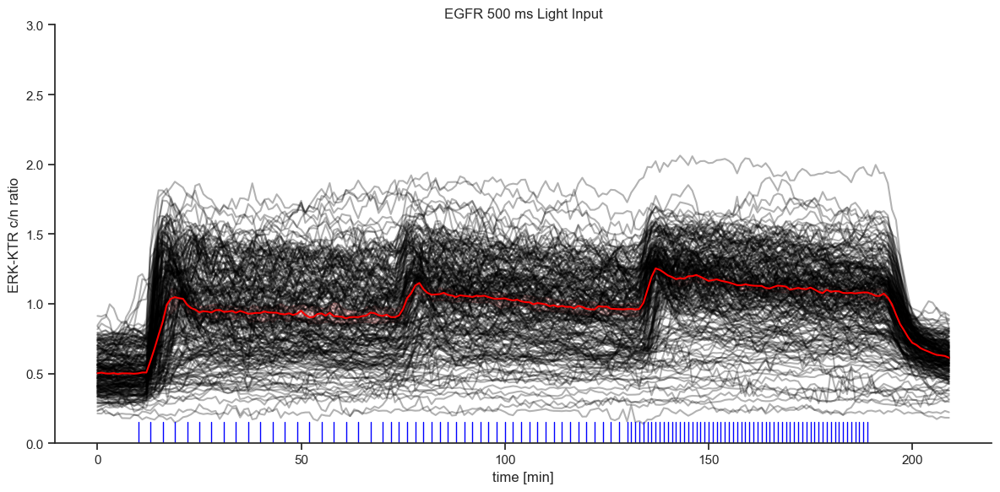

<Figure size 7200x3600 with 0 Axes>

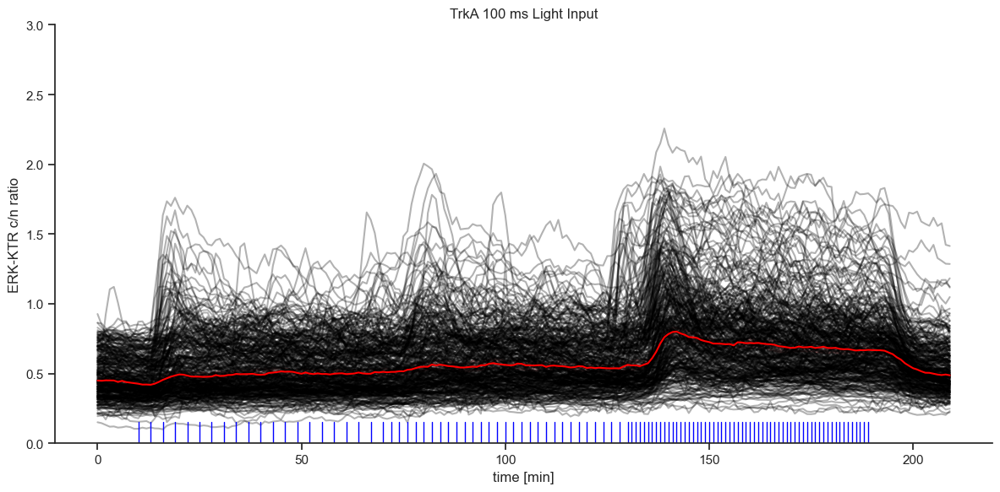

<Figure size 7200x3600 with 0 Axes>

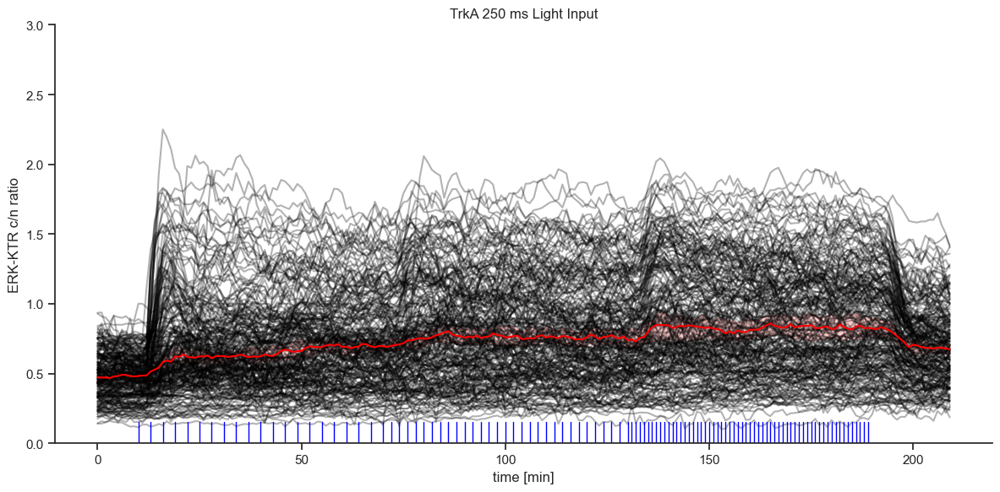

<Figure size 7200x3600 with 0 Axes>

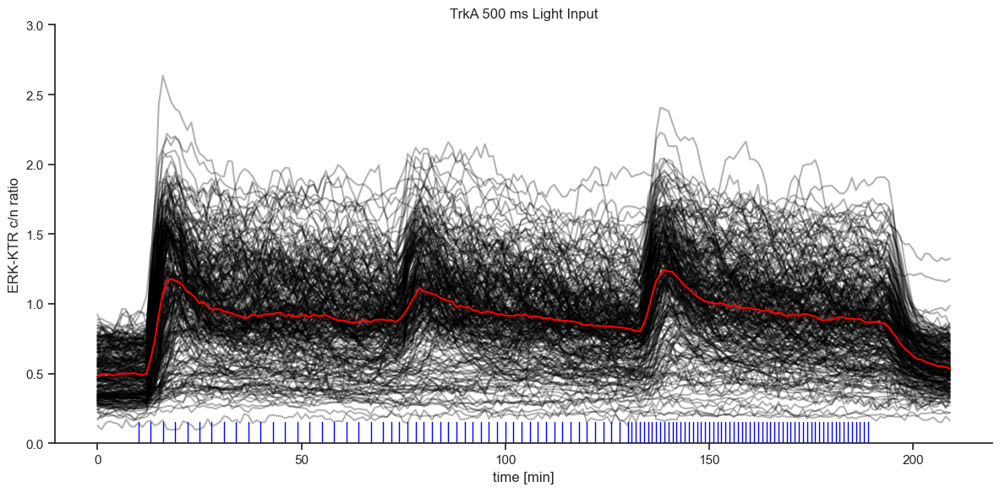

In [26]:
for cell_line in cell_lines: 
    for stim_strength in stim_strength_list:
        plt.figure(figsize=(12, 6), dpi=600)
        num_cells = df_plot.query("cell_line == @cell_line & stim_strength == @stim_strength")["uid"].nunique()
        sns.set_theme(style="ticks")
        
        # Create the FacetGrid
        g = sns.FacetGrid(
            df_plot.query("cell_line == @cell_line & stim_strength == @stim_strength"), 
            height=6, 
            aspect=2
        )
        
        # Plot individual traces and mean with confidence interval
        g.map_dataframe(sns.lineplot, x='frame', y='cnr_median', units="uid", estimator=None, color="black", alpha=0.3)
        g.map_dataframe(sns.lineplot, x='frame', y='cnr_median', errorbar=('ci', 90), color="red", estimator="median")
        
        # Add vertical lines for stim_timestep
    
        for x in range(10, 70, 3):
            plt.axvline(x=x, color='blue', linestyle='-', ymin=0.0, ymax=0.05, linewidth=1)

        for x in range(70, 130, 2):
            plt.axvline(x=x, color='blue', linestyle='-', ymin=0.0, ymax=0.05, linewidth=1)
        
        for x in range(130, 190, 1):
            plt.axvline(x=x, color='blue', linestyle='-', ymin=0.0, ymax=0.05, linewidth=1)
            
        # g.map_dataframe(add_vertical_lines)
        
        # Set axis labels and titles
        g.set_axis_labels('time [min]', 'ERK-KTR c/n ratio')
        # Override all subplot titles
        for ax in g.axes.flat:
            ax.set_title(f"{cell_line} {stim_strength} Light Input")
        g.set(ylim=(0, 3))

        g.tight_layout()
        
        # Save and show the plot
        plt.savefig(f"figures/{cell_line}_{stim_strength}_multi_traces_erkktr.png", bbox_inches='tight')
        plt.show()

## Random Subplots

Not Normalized

<Figure size 1500x750 with 0 Axes>

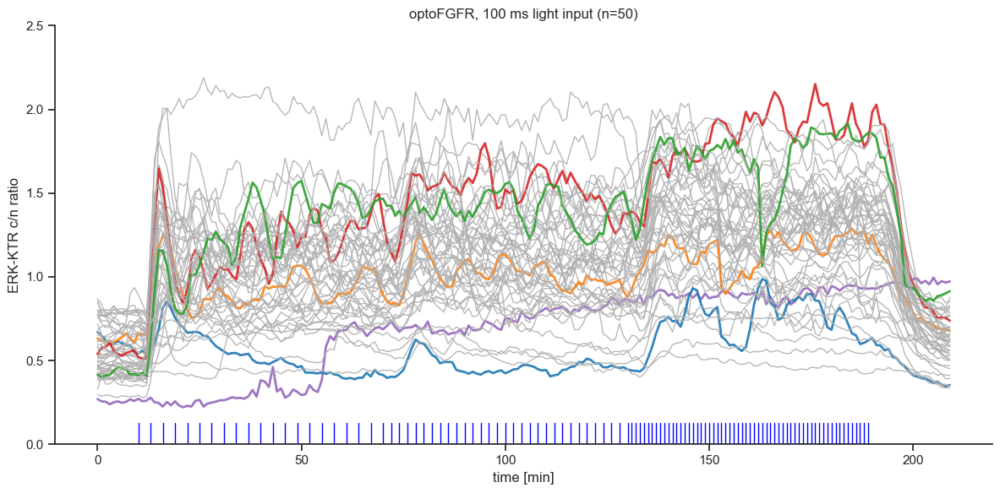

<Figure size 1500x750 with 0 Axes>

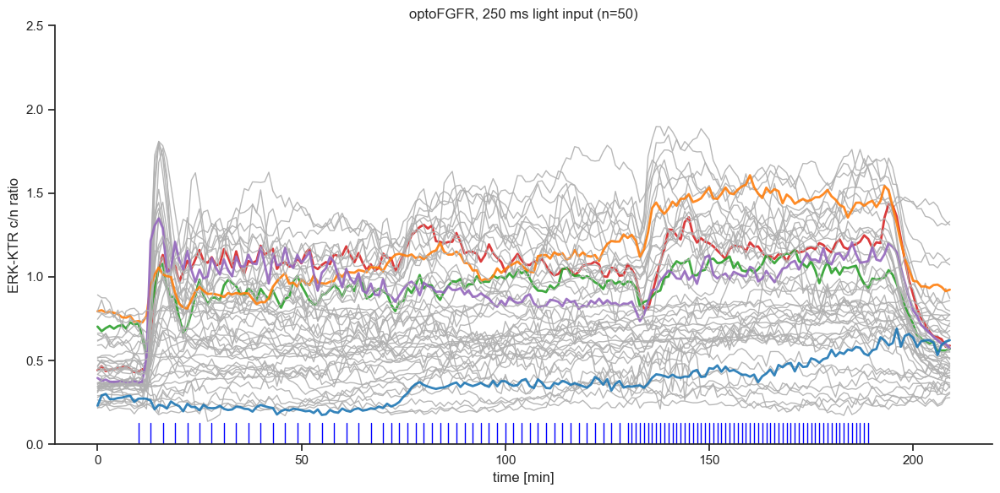

<Figure size 1500x750 with 0 Axes>

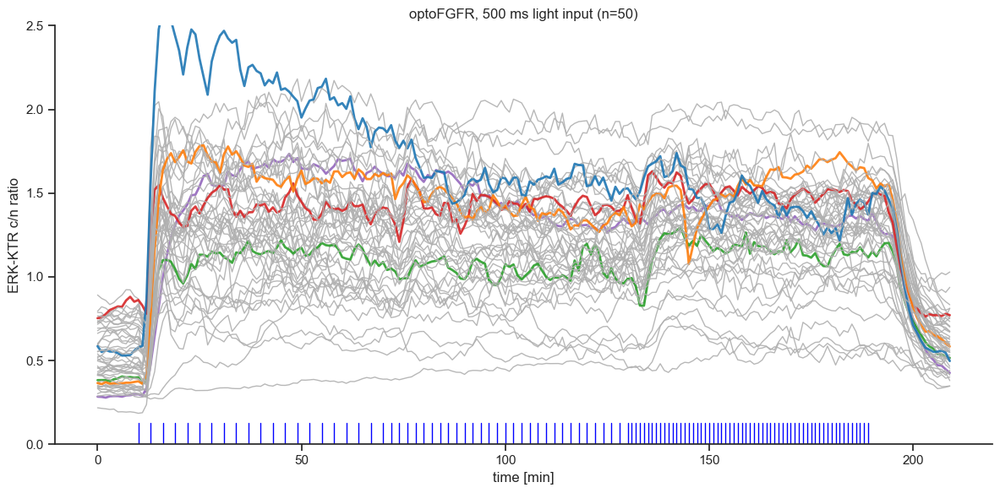

<Figure size 1500x750 with 0 Axes>

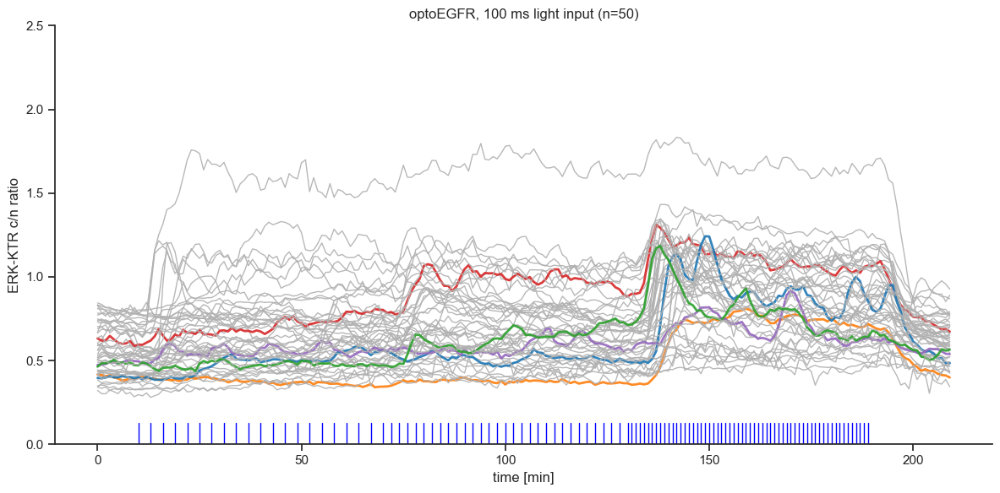

<Figure size 1500x750 with 0 Axes>

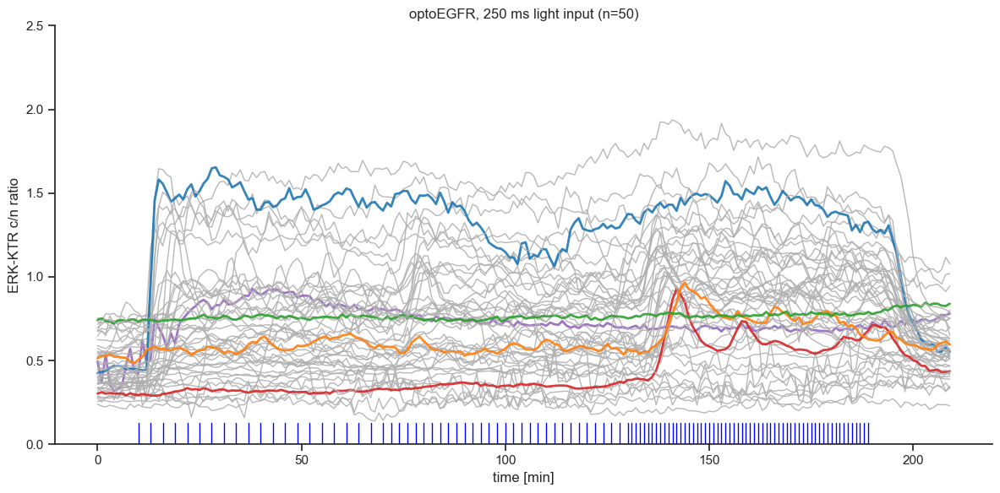

<Figure size 1500x750 with 0 Axes>

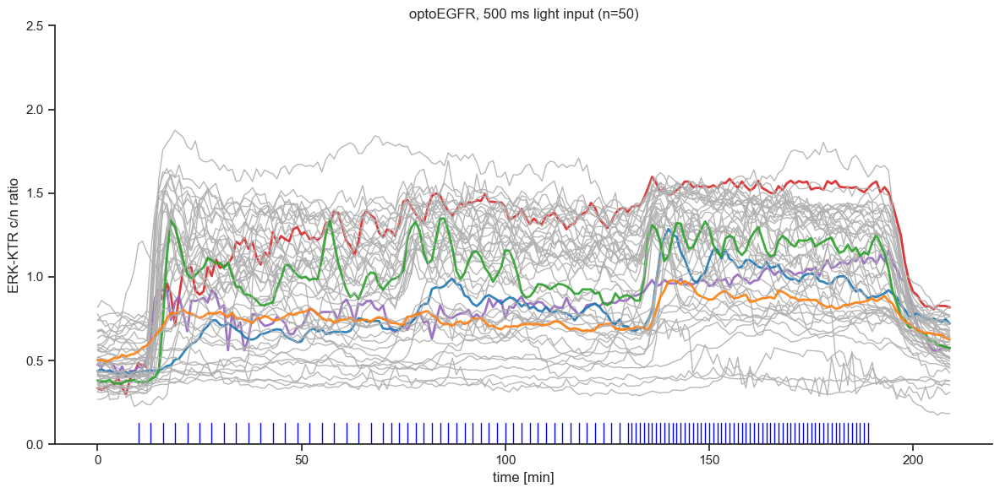

<Figure size 1500x750 with 0 Axes>

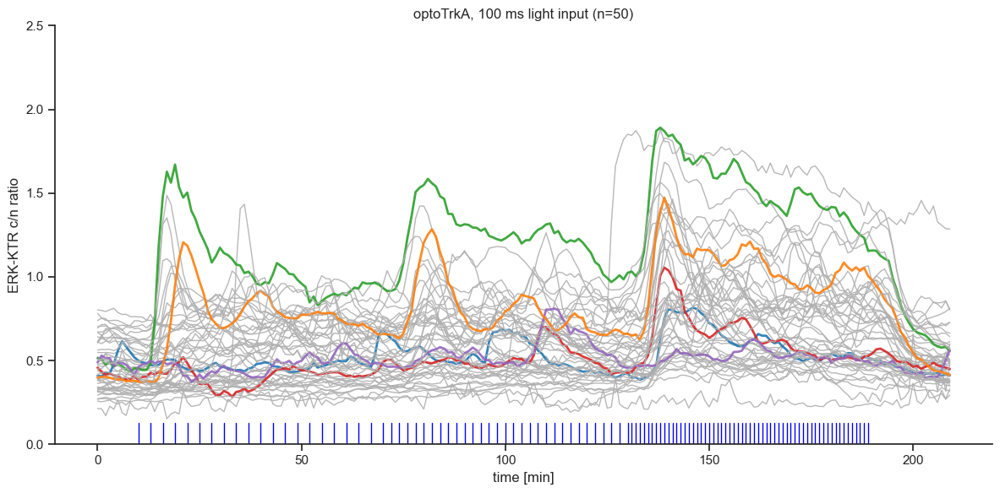

<Figure size 1500x750 with 0 Axes>

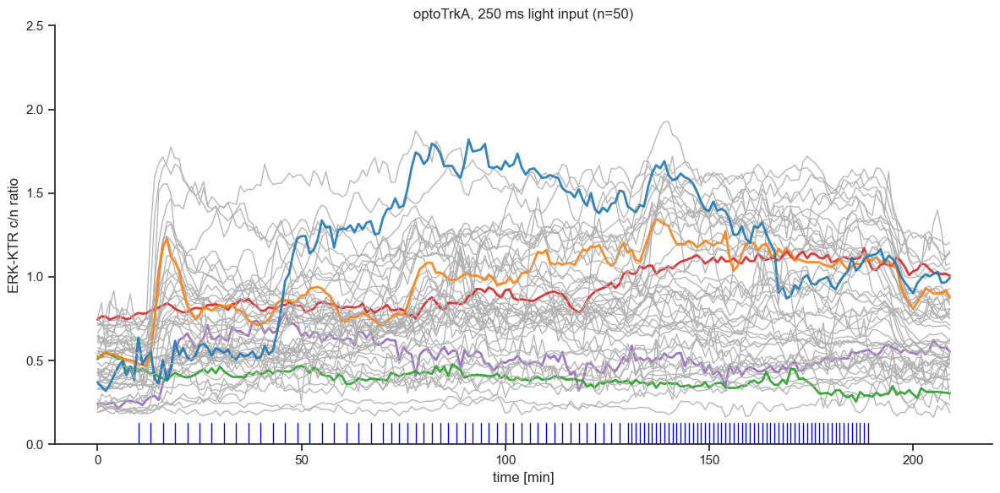

<Figure size 1500x750 with 0 Axes>

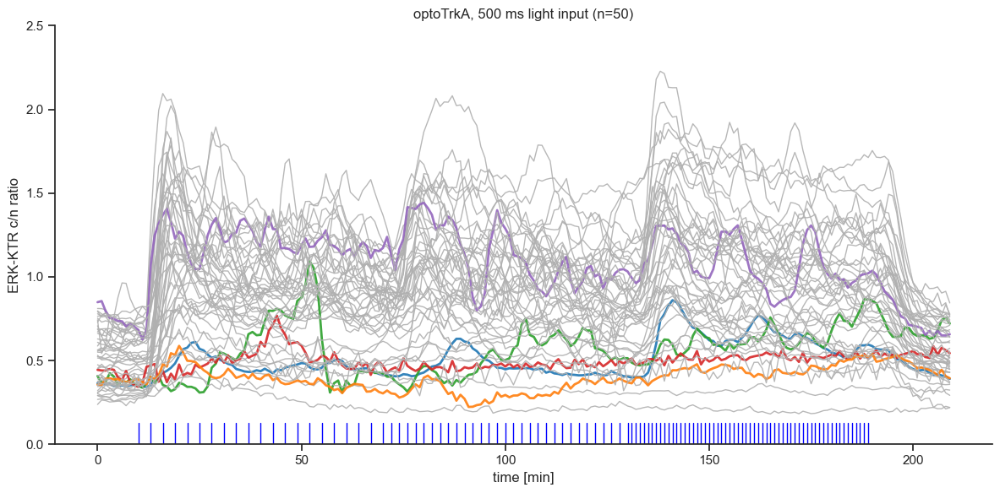

In [24]:
for cell_line in cell_lines: 
    for stim_strength in stim_strength_list:
        # Filter for this cell line and stim_strength
        df_cell = df_plot.query("cell_line == @cell_line & stim_strength == @stim_strength")

        # Get unique uids
        unique_uids = df_cell["uid"].unique()

        # Sample 10 random unique uids
        sampled_uids = np.random.choice(unique_uids, size=50, replace=False)

        # Randomly select 5 uids to highlight
        highlight_uids = np.random.choice(sampled_uids, size=5, replace=False)

        # Build color palette
        base_gray = "#B0B0B0"
        highlight_colors = sns.color_palette("tab10", 5)

        palette = {}
        color_idx = 0
        for uid in sampled_uids:
            if uid in highlight_uids:
                palette[uid] = highlight_colors[color_idx]
                color_idx += 1
            else:
                palette[uid] = base_gray

        # Filter the data to only these 10 cells
        df_sub = df_cell[df_cell["uid"].isin(sampled_uids)].copy()
        df_sub["is_highlight"] = df_sub["uid"].isin(highlight_uids)

        plt.figure(figsize=(6, 3), dpi=250)
        sns.set_theme(style="ticks")
        
        g = sns.FacetGrid(
            df_sub, 
            height=6, 
            aspect=2
        )
        
        for x in range(10, 70, 3):
            plt.axvline(x=x, color='blue', linestyle='-', ymin=0.0, ymax=0.05, linewidth=1)

        for x in range(70, 130, 2):
            plt.axvline(x=x, color='blue', linestyle='-', ymin=0.0, ymax=0.05, linewidth=1)
        
        for x in range(130, 190, 1):
            plt.axvline(x=x, color='blue', linestyle='-', ymin=0.0, ymax=0.05, linewidth=1)

        ax = g.ax

        for uid, df_uid in df_sub.groupby("uid"):
            sns.lineplot(
                data=df_uid,
                x='frame',
                y='cnr_median',
                color=palette[uid],
                linewidth=2 if uid in highlight_uids else 1,
                alpha=0.9,
                ax=ax,
                legend=False
            )


        g.set_axis_labels('time [min]', 'ERK-KTR c/n ratio')
        for ax in g.axes.flat:
            ax.set_title("Ramp 50 ms - 300 ms")
        g.set(ylim=(0.0, 2.5))
        g.tight_layout()
        
        plt.title(f"opto{cell_line}, {stim_strength} light input (n=50)")
        plt.savefig(f"figures/{cell_line}_{stim_strength}_50random_erkktr.png", bbox_inches='tight')
        plt.show()

In [31]:
# Count how many 'High' and 'Low' cells per FOV
counts = df.groupby(['cell_line', 'stim_strength', 'expression_group'])['uid'].nunique().reset_index(name='count')

# Calculate total cells per FOV
# counts['total_per_fov'] = counts.groupby('stim_strength', 'cell_line')['count'].transform('sum')

# Compute percentage
# counts['percent'] = 100 * counts['count'] / counts['total_per_fov']

counts

C:\Users\czahn\AppData\Local\Temp\ipykernel_7648\2769600310.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = df.groupby(['cell_line', 'stim_strength', 'expression_group'])['uid'].nunique().reset_index(name='count')


,cell_line,stim_strength,expression_group,count
0,EGFR,50 ms,Low,4
1,EGFR,50 ms,High,13
2,EGFR,100 ms,Low,89
3,EGFR,100 ms,High,126
4,EGFR,250 ms,Low,118
5,EGFR,250 ms,High,112
6,EGFR,500 ms,Low,129
7,EGFR,500 ms,High,89
8,FGFR,50 ms,Low,10
9,FGFR,50 ms,High,14


In [24]:
df

,mean_intensity_C0_nuc,mean_intensity_C1_nuc,label,x,y,area,median_intensity_C0_nuc,median_intensity_C1_nuc,mean_intensity_C0_ring,mean_intensity_C1_ring,...,stim_channel_power_property_name,stim_exposure,stim,optocheck_mean_intensity,uid,frame,cnr_norm,median_cnr_0_9,stim_strength,expression_group
0,1933.671506,15295.230490,3,168.551724,660.101633,551.0,1930.0,15878.0,441.762376,5998.643564,...,Cyan_Level,0.0,False,853.996988,0_2,0,1.000518,0.391987,50 ms,Low
1,1373.912060,7746.080402,16,474.839196,984.155779,398.0,1390.0,8064.0,401.812865,2870.157895,...,Cyan_Level,0.0,False,1717.342105,0_15,0,0.998616,0.371044,50 ms,High
4,2711.843694,29446.596803,39,782.669627,716.605684,563.0,2747.0,29621.0,473.694581,22218.403941,...,Cyan_Level,0.0,False,1079.592857,0_37,0,1.011522,0.745938,50 ms,High
5,1937.128801,15030.520572,3,170.107335,660.037567,559.0,1914.0,15540.0,420.472906,5914.103448,...,Cyan_Level,0.0,False,853.996988,0_2,1,1.003790,0.391987,50 ms,Low
6,1375.891089,7578.388614,16,476.259901,983.779703,404.0,1388.5,7865.5,391.845714,2848.205714,...,Cyan_Level,0.0,False,1717.342105,0_15,1,1.012906,0.371044,50 ms,High
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
639823,2313.136139,7917.316832,83,808.858911,419.403465,404.0,2375.5,8215.5,412.825843,3629.853933,...,Cyan_Level,0.0,False,824.274752,59_101,209,0.862217,0.531734,500 ms,High
639825,1107.156695,6016.693732,85,824.413105,81.703704,702.0,1148.5,6139.5,489.192661,3443.183486,...,Cyan_Level,0.0,False,649.625356,59_99,209,1.028499,0.556414,500 ms,Low
639826,3591.494105,3440.141479,86,826.130761,548.793140,933.0,3569.0,3508.0,456.612245,2537.097959,...,Cyan_Level,0.0,False,642.646302,59_104,209,0.936284,0.787686,500 ms,Low
639828,1114.377939,7094.415913,94,1001.054250,288.990958,553.0,1190.0,7650.0,328.530303,2601.176768,...,Cyan_Level,0.0,False,685.072333,59_109,209,1.134946,0.323056,500 ms,Low


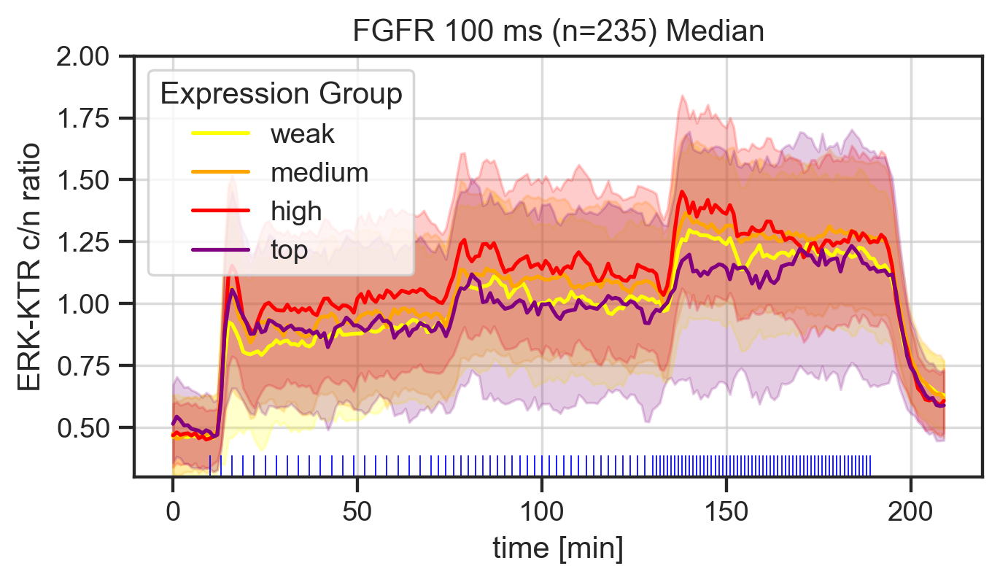

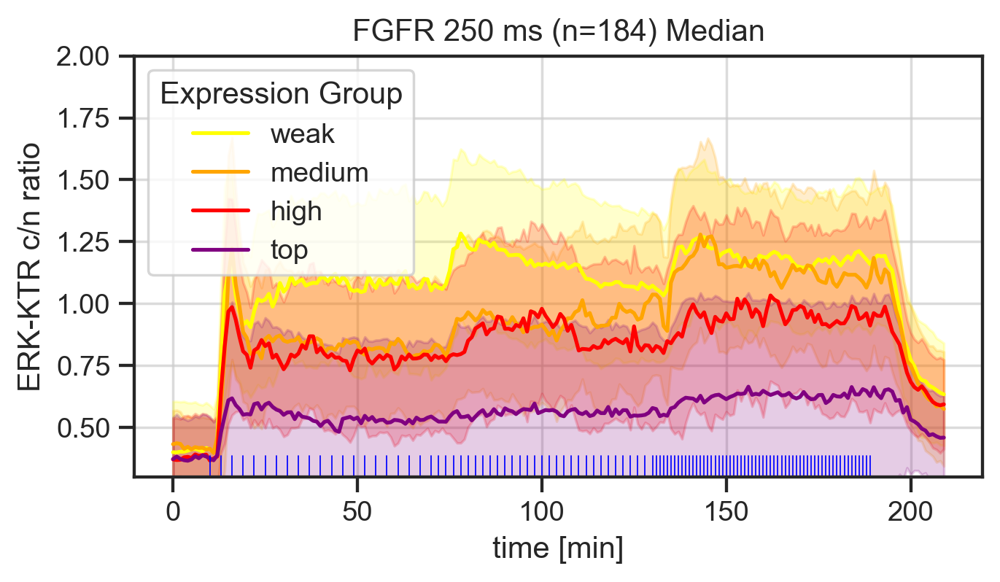

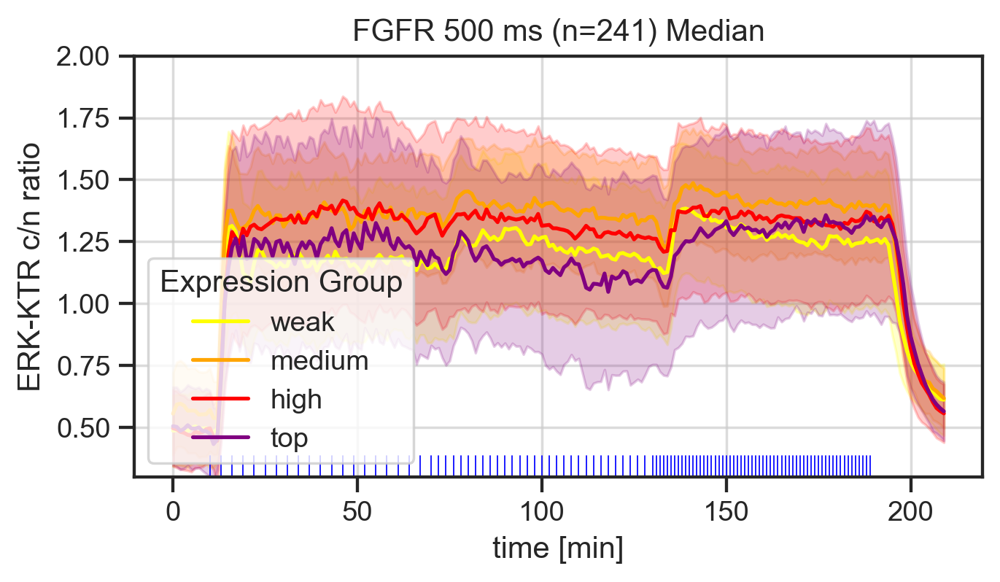

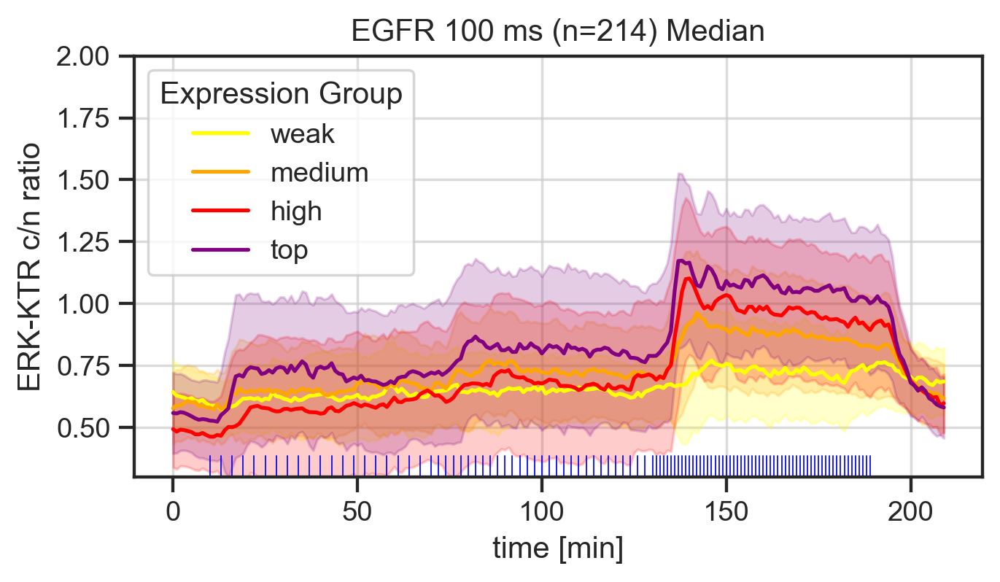

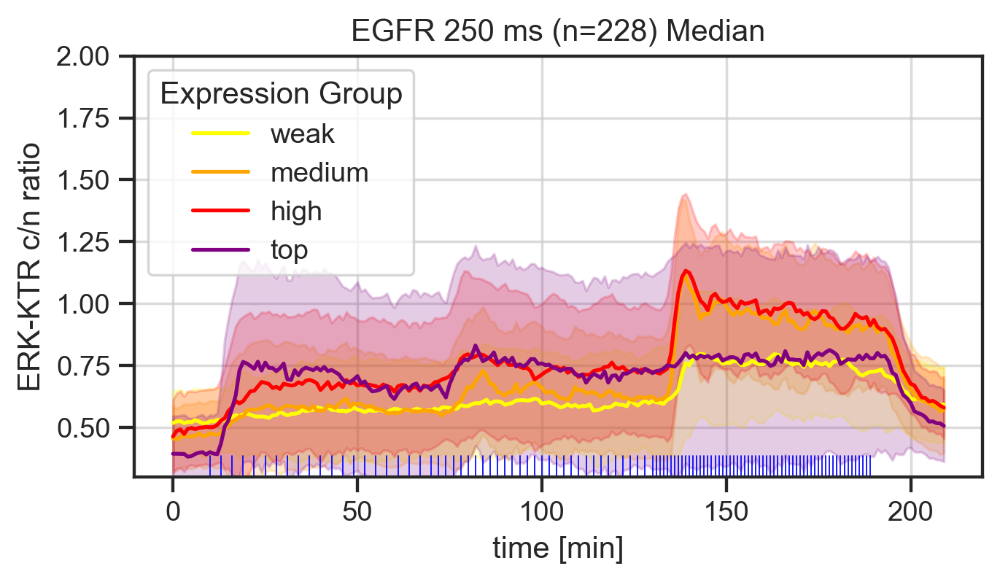

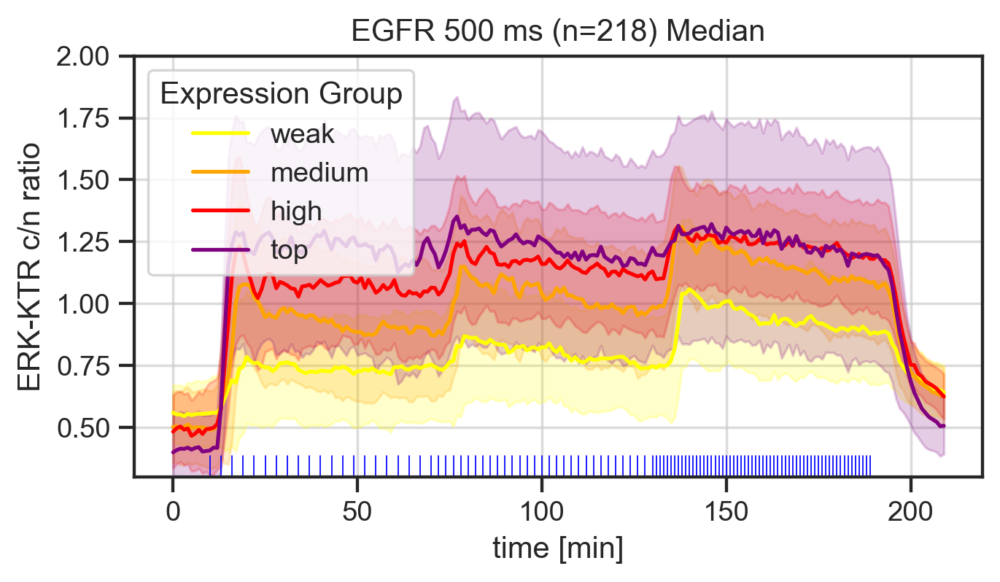

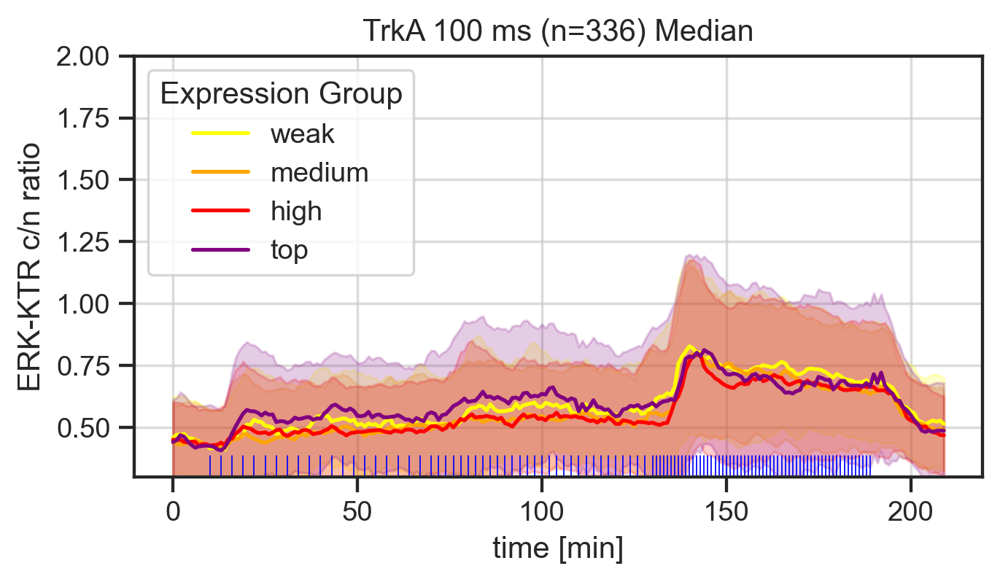

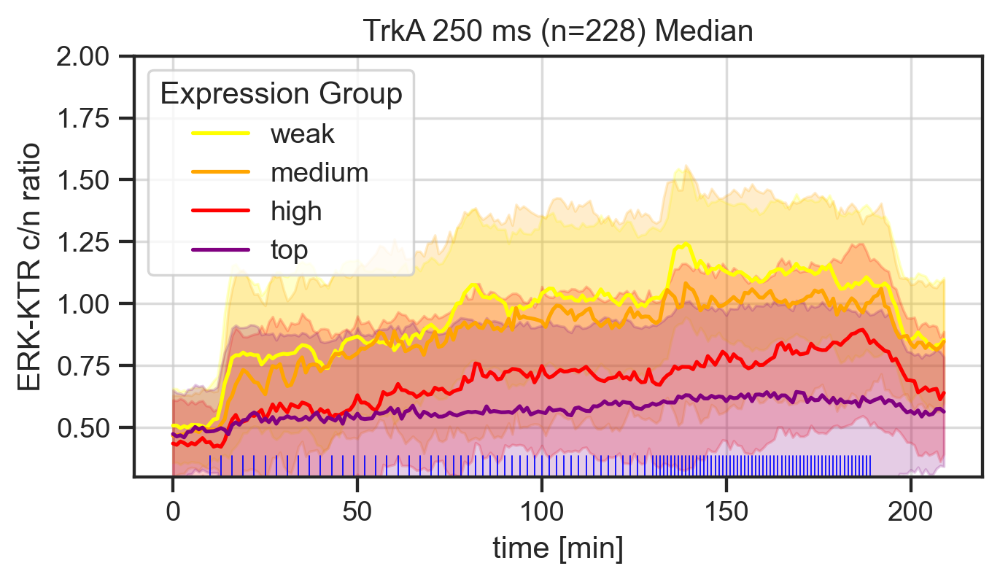

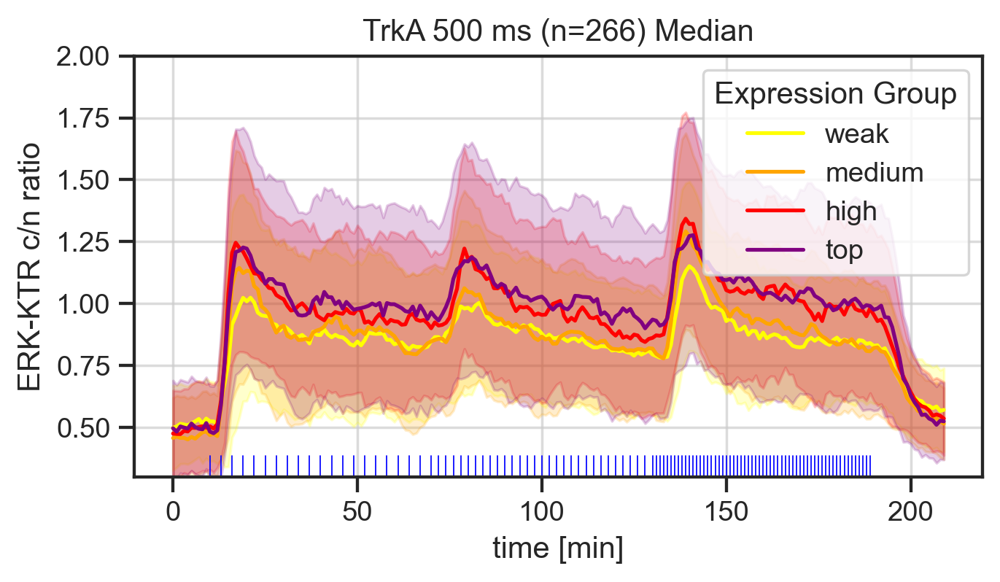

In [27]:
cell_lines = df_plot["cell_line"].unique()

for cell_line in cell_lines: 
    for stim_strength in stim_strength_list: 
        plt.figure(figsize=(6, 3), dpi=250)
        
        # Filter the dataframe for this cell line
        df_sub = df_plot[(df_plot["cell_line"] == cell_line) &
                 (df_plot["stim_strength"] == stim_strength)]
        num_cells = df_sub["uid"].nunique()

        plt.grid(True, linestyle='-', alpha=0.7)

        # Lineplot with hue for expression group
        ax = sns.lineplot(
            data=df_sub,
            x='frame',
            y='cnr_median',
            hue='expression_group',  # Add hue for Low/High
            estimator='median',
            errorbar='sd',
            palette={'weak': 'yellow', 'medium': 'orange', 'high': 'red', 'top': 'purple'}  # Optional: custom colors
        )

        plt.ylabel('ERK-KTR c/n ratio')
        plt.xlabel('time [min]')

        # Combine the ranges into one list
        x_values = list(range(10, 70, 3)) + list(range(70, 129, 2)) + list(range(130, 190, 1))

        # Plot vertical lines at each x
        for x in x_values:
            plt.axvline(x=x, color='blue', linestyle='-', ymin=0.0, ymax=0.05, linewidth=0.5)

        plt.ylim(0.3, 2)
        plt.title(f"{cell_line} {stim_strength} (n={num_cells}) Median")

        plt.legend(title='Expression Group')  # Update legend title
        plt.show()

C:\Users\czahn\AppData\Local\Temp\ipykernel_15756\585521242.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_sub.groupby("expression_group")["uid"]


<Figure size 7200x3600 with 0 Axes>

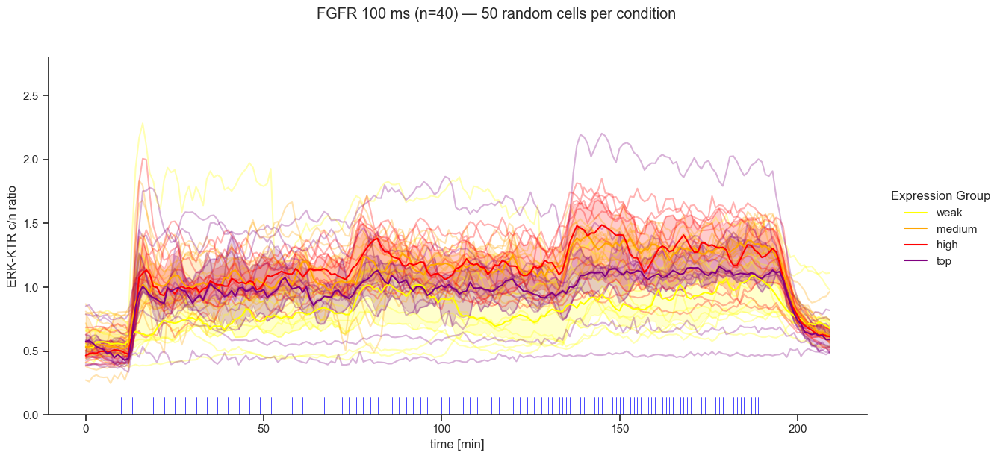

C:\Users\czahn\AppData\Local\Temp\ipykernel_15756\585521242.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_sub.groupby("expression_group")["uid"]


<Figure size 7200x3600 with 0 Axes>

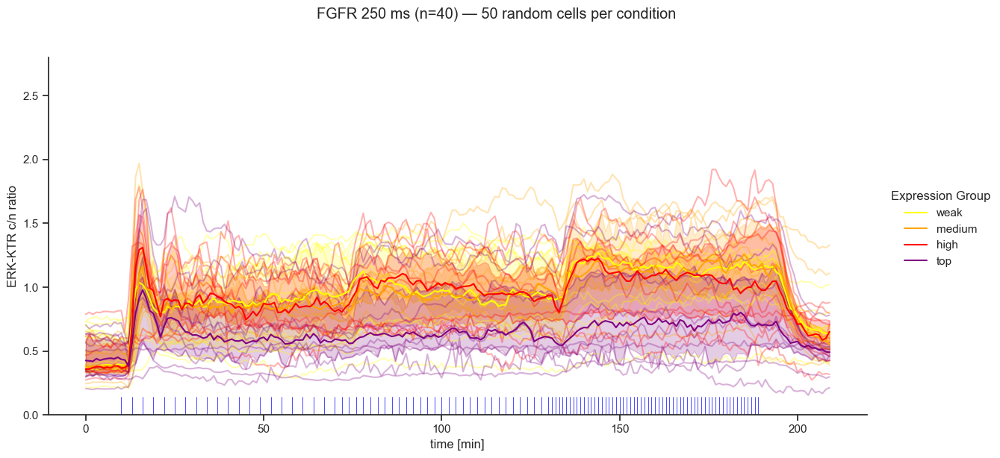

C:\Users\czahn\AppData\Local\Temp\ipykernel_15756\585521242.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_sub.groupby("expression_group")["uid"]


<Figure size 7200x3600 with 0 Axes>

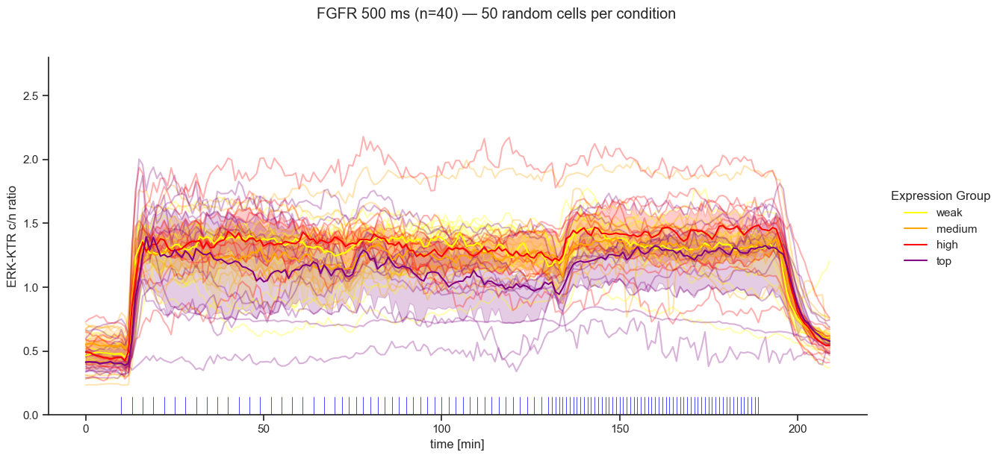

C:\Users\czahn\AppData\Local\Temp\ipykernel_15756\585521242.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_sub.groupby("expression_group")["uid"]


<Figure size 7200x3600 with 0 Axes>

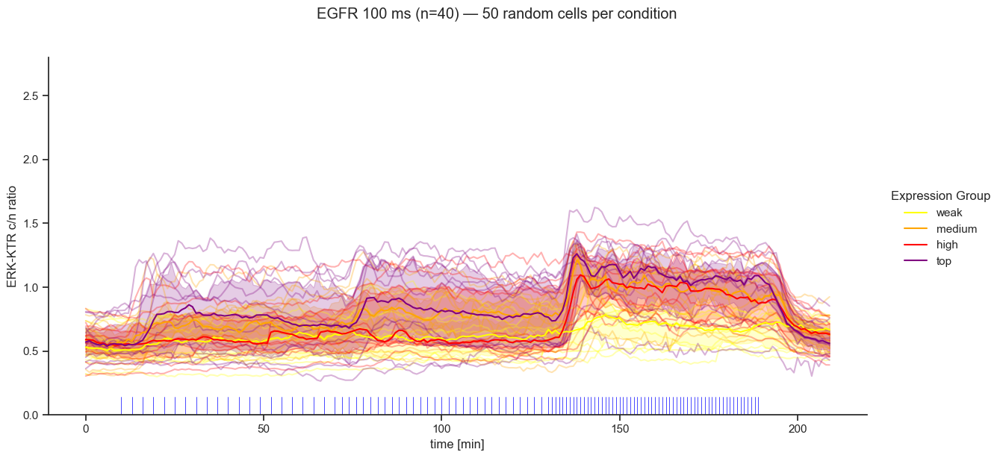

C:\Users\czahn\AppData\Local\Temp\ipykernel_15756\585521242.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_sub.groupby("expression_group")["uid"]


<Figure size 7200x3600 with 0 Axes>

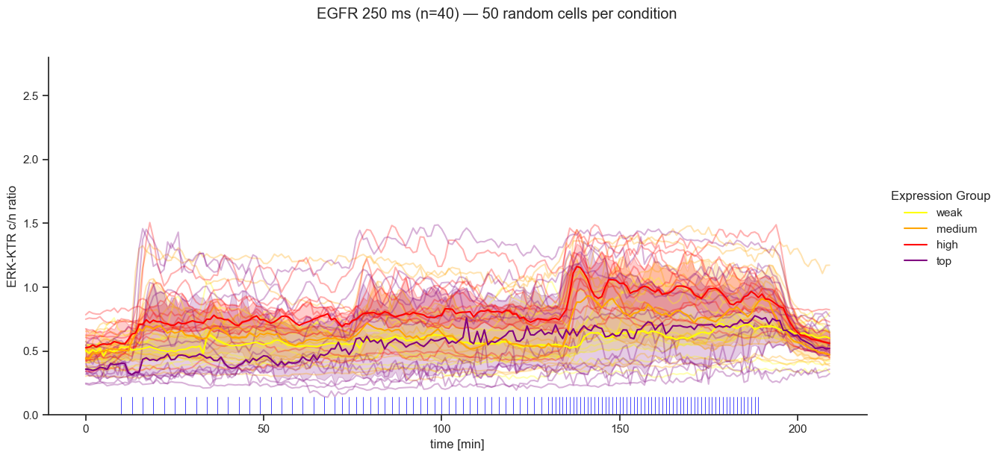

C:\Users\czahn\AppData\Local\Temp\ipykernel_15756\585521242.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_sub.groupby("expression_group")["uid"]


<Figure size 7200x3600 with 0 Axes>

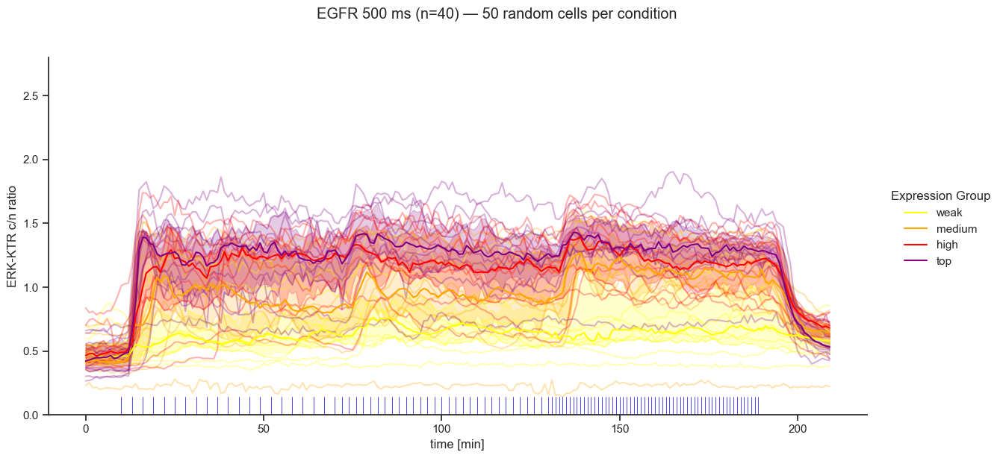

C:\Users\czahn\AppData\Local\Temp\ipykernel_15756\585521242.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_sub.groupby("expression_group")["uid"]


<Figure size 7200x3600 with 0 Axes>

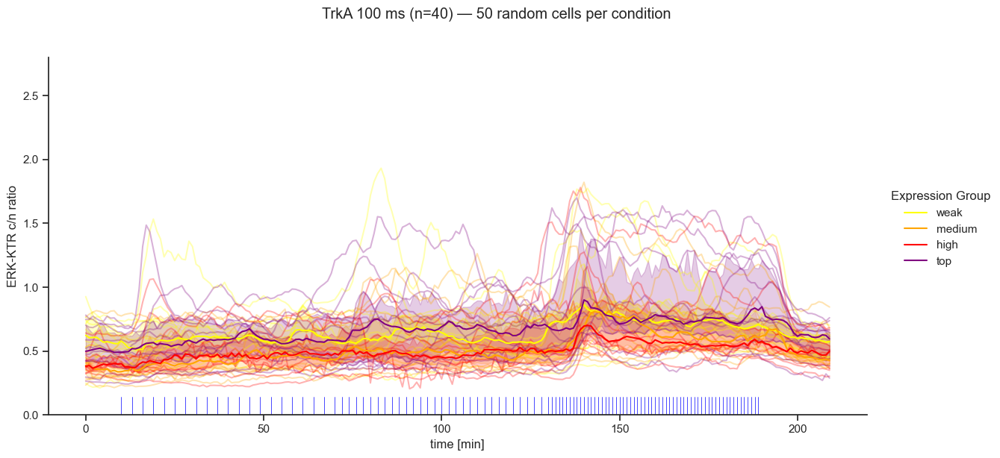

C:\Users\czahn\AppData\Local\Temp\ipykernel_15756\585521242.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_sub.groupby("expression_group")["uid"]


<Figure size 7200x3600 with 0 Axes>

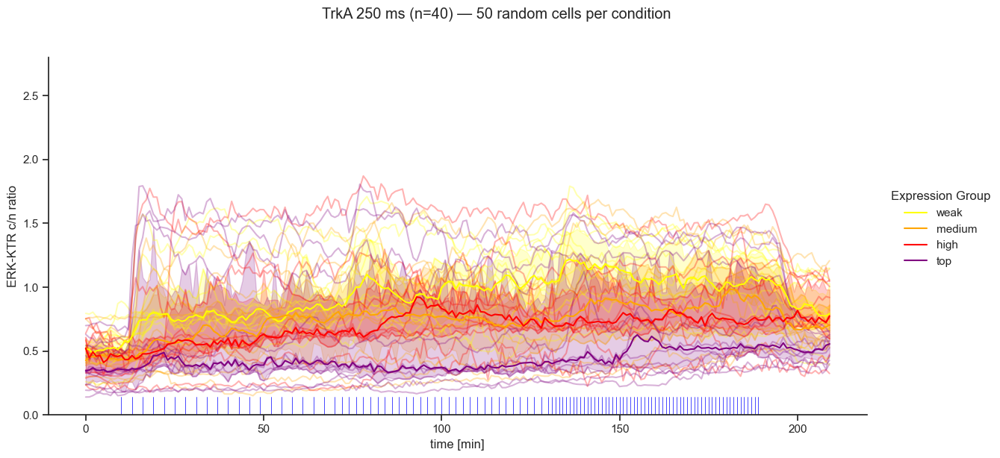

C:\Users\czahn\AppData\Local\Temp\ipykernel_15756\585521242.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_sub.groupby("expression_group")["uid"]


<Figure size 7200x3600 with 0 Axes>

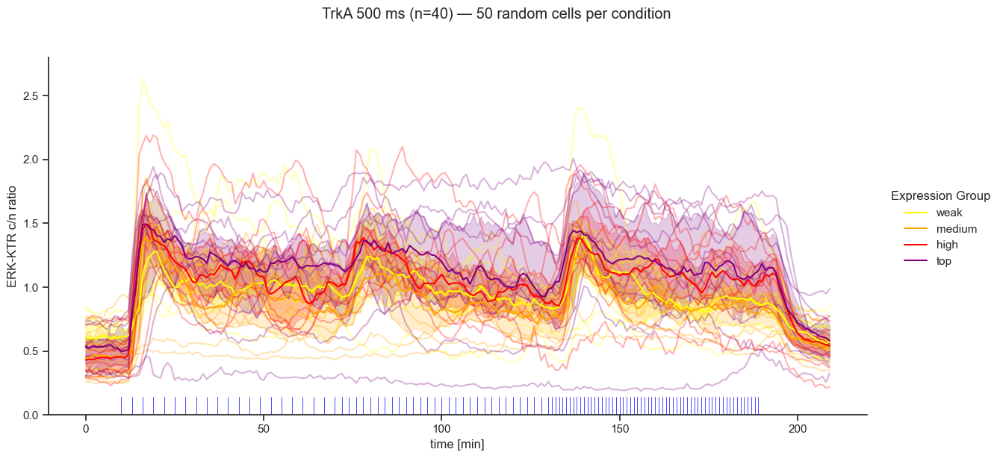

In [29]:
cell_lines = df_plot["cell_line"].unique()
x_values = list(range(10, 70, 3)) + list(range(70, 129, 2)) + list(range(130, 190, 1))

for cell_line in cell_lines:
    for stim_strength in stim_strength_list:
        plt.figure(figsize=(12, 6), dpi=600)
        sns.set_theme(style="ticks")

        # Subset to current cell line
        df_sub = df_plot[(df_plot["cell_line"] == cell_line) &
                 (df_plot["stim_strength"] == stim_strength)]

        # Randomly sample up to 50 cells per expression group
        sampled_uids = (
            df_sub.groupby("expression_group")["uid"]
            .apply(lambda x: np.random.choice(x.unique(), size=min(10, len(x.unique())), replace=False))
            .explode()
            .values
        )
        df_sampled = df_sub[df_sub["uid"].isin(sampled_uids)]

        num_cells = df_sampled["uid"].nunique()

        # Create FacetGrid
        g = sns.FacetGrid(
            df_sampled,
            height=6,
            aspect=2,
            hue="expression_group",
            palette={"weak": "yellow", "medium": "orange", "high": "red", "top": "purple"},
            sharey=True
        )

        # Plot individual traces per sampled cell
        g.map_dataframe(
            sns.lineplot,
            x="frame", y="cnr_median", units="uid", estimator=None, alpha=0.3
        )

        # Plot median ±90% CI per group
        g.map_dataframe(
            sns.lineplot,
            x="frame", y="cnr_median", estimator="median", errorbar=("ci", 90)
        )

        # Add vertical lines
        ax = g.axes[0, 0] if hasattr(g.axes, "__getitem__") else g.ax
        for x in x_values:
            ax.axvline(x=x, color="blue", linestyle="-", ymin=0.0, ymax=0.05, linewidth=0.5)

        # Customize layout
        g.set_axis_labels("time [min]", "ERK-KTR c/n ratio")
        g.set(ylim=(0, 2.8))
        g.fig.suptitle(f"{cell_line} {stim_strength} (n={num_cells}) — 50 random cells per condition", y=1.02)
        g.add_legend(title="Expression Group")
        g.tight_layout()
        
        plt.show()